In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
SED = 'ARM2_HII2_stitch.dat'
raw_file = np.genfromtxt('intrat.out_1e3_8e3', skip_header = 3)
column_names = ['WL (microns)', 'flux density', 'transition (from, to)', 'electron density', 'effective temperature']
WL_reduced = raw_file[:,0]
flux_reduced = raw_file[:,1]
transition_reduced = []
for i in range(0,len(flux_reduced)):
    transition_reduced.append([raw_file[i,3],raw_file[i,5]])
e_density = raw_file[0,7]
Teff = raw_file[0,9]
print(f'example transition_reduced[1]: {transition_reduced[1]} represents 7->3 transition')

example transition_reduced[1]: [7.0, 3.0] represents 7->3 transition


In [2]:
# Function to import the dataset and process it
def import_data(file_path):
    data_list = []

    # Open the file and process each line manually
    with open(file_path, 'r') as file:
        # Read the header (first line)
        header = file.readline().strip().split()

        # Process each line
        for line in file:
            # Split the line into parts (split at spaces)
            parts = line.strip().split(maxsplit=4)
            
            # If the 5th part (notes) is missing, append NaN
            if len(parts) < 5:
                parts.append(np.nan)
            
            data_list.append(parts)

    # Convert the list into a pandas DataFrame
    data = pd.DataFrame(data_list, columns=header)

    # Convert the DataFrame to a NumPy array
    data_array = data.to_numpy()

    return data_array

# Example usage: provide the path to the .dat file
data_array = import_data(SED)

print(data_array[58,4])
mask = data_array[:,3].astype(int)
WL = data_array[:,0].astype(float)
WL_masked = np.where(mask == 1, WL, np.nan)
intens = data_array[:,1].astype(float)
intens_masked = np.where(mask == 1, intens, np.nan)

intens_uncert = data_array[:,2].astype(float)
intens_uncert_masked = np.where(mask == 1, intens_uncert, np.nan)

notes = data_array[:,4]

def gaussian_func(x, amplitude, xmean, stddev):
    return (amplitude * np.exp(-0.5 * ((x - xmean) / stddev)**2)) + 1
def find_closest_index(h_WL):
    # Calculate the absolute difference between each element in WL and h_WL
    difference = np.abs(WL - h_WL)
    
    # Find the index of the minimum difference
    closest_index = np.argmin(difference)
    
    return closest_index


H 7-3 Pa delta 1.0049 -> 1.0066


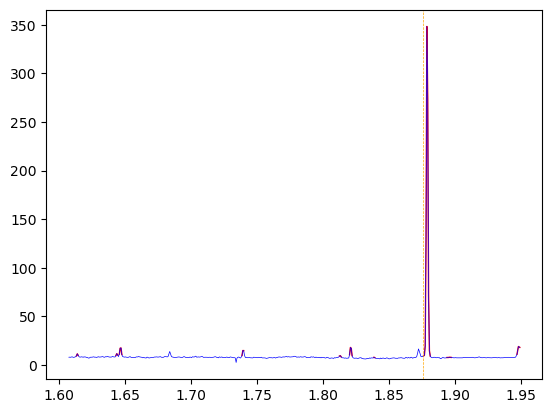

In [3]:
start = 1000
end = 1500
mask_test = mask[start:end]
WL_test = WL[start:end]
WL_test_masked = np.where(mask_test == 1, WL_test, np.nan)

intens_test = intens[start:end]
intens_test_masked = np.where(mask_test == 1, intens_test, np.nan)

mask_test = mask[start:end]
xrange = range(0,len(intens_test))
plt.plot(WL_test_masked, intens_test_masked, linewidth = 1, color = 'red')
plt.plot(WL_test, intens_test, linewidth = 0.5, color = 'blue')
plt.axvline(x=1.875621, color='orange', linestyle='--', linewidth=0.5, label = '32 min 3rd harmonic')

plt.show()

In [4]:
def get_feature_flux(target_WL):
    closest_index = np.argmin(np.abs(WL - target_WL))
    if mask[closest_index]==0:
        counter = 0
        print("Target wavelength was not part of a feature, trying next wavelength...")
        while mask[closest_index]==0 and counter < 3:
            closest_index+=1
            counter +=1
    if counter == 3:
        print(f"could not identify feature at this wavelength {target_WL}")
        return None
    start_index = closest_index
    end_index = closest_index
    while start_index > 0 and mask[start_index] == 1:
        start_index -= 1
    # Correct the index to include the first valid point
    if mask[start_index] == 0:
        start_index += 1
    
    # Search to the right (increasing index) until a 0 in the mask is found
    while end_index < len(WL) - 1 and mask[end_index] == 1:
        end_index += 1
    # Correct the index to include the last valid point
    if mask[end_index] == 0:
        end_index -= 1
    
    # Extract the wavelengths part of the feature
    WL_feature = WL[start_index:end_index + 1]
    
    flux = np.trapz(intens[start_index:end_index+1], WL_feature)

    return flux
for i in range(0,10):
    
    flux = get_feature_flux(WL_reduced[i])
    print(f"The area under the emission feature at {WL_reduced[i]}microns is: {flux}")

def find_max(minimum, maximum):
    find_max_mask = (WL >= minimum) & (WL <= maximum)
    return np.max(intens[find_max_mask])
find_max(1.80,1.90)

Target wavelength was not part of a feature, trying next wavelength...
could not identify feature at this wavelength 0.954861
The area under the emission feature at 0.954861microns is: None
Target wavelength was not part of a feature, trying next wavelength...
The area under the emission feature at 1.005215microns is: 0.02894425505999746
Target wavelength was not part of a feature, trying next wavelength...
The area under the emission feature at 1.094112microns is: 0.04358933166000091
Target wavelength was not part of a feature, trying next wavelength...
The area under the emission feature at 1.282163microns is: 0.1108085150999943
Target wavelength was not part of a feature, trying next wavelength...
The area under the emission feature at 1.875621microns is: 0.5596497206760062
Target wavelength was not part of a feature, trying next wavelength...
could not identify feature at this wavelength 1.468603
The area under the emission feature at 1.468603microns is: None
Target wavelength was 

348.2473

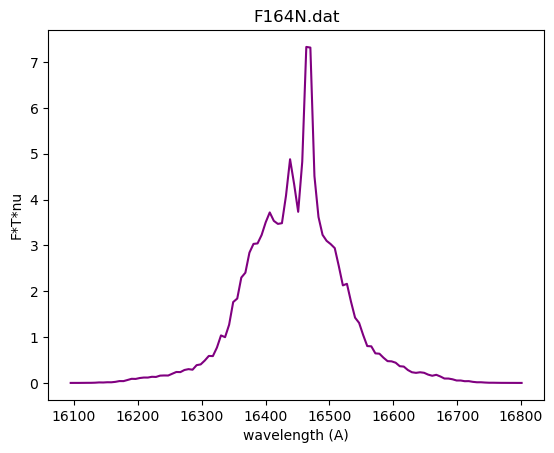

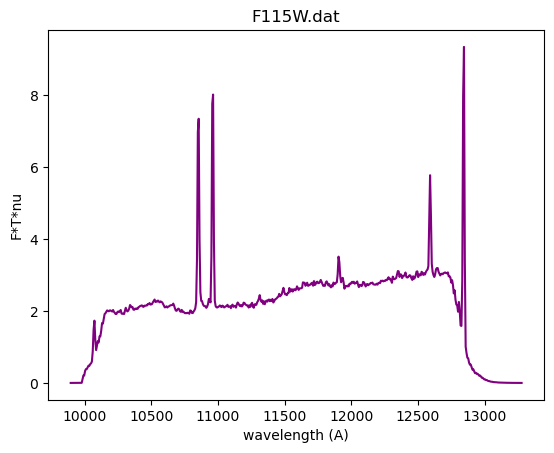

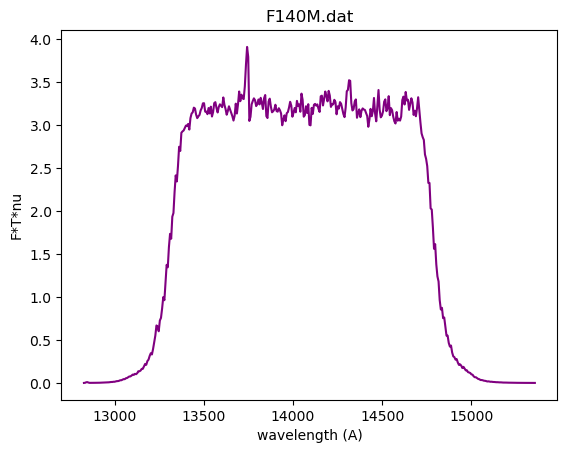

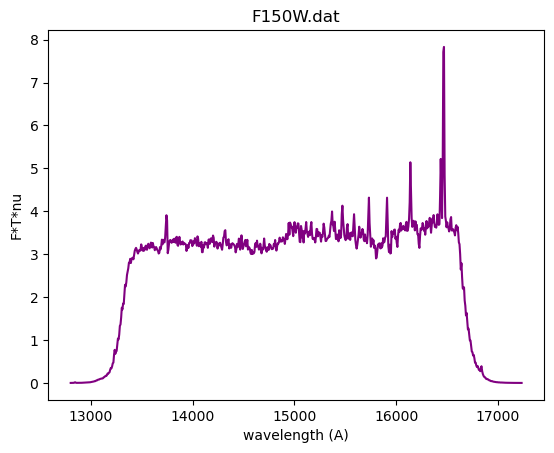

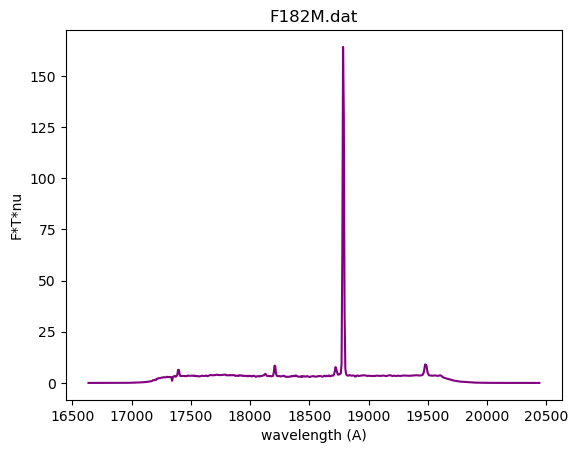

...

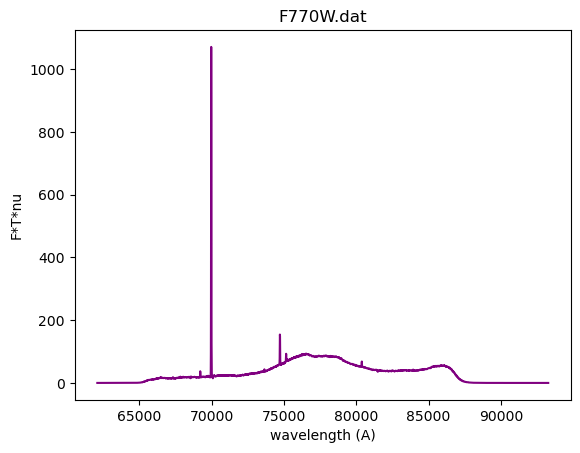

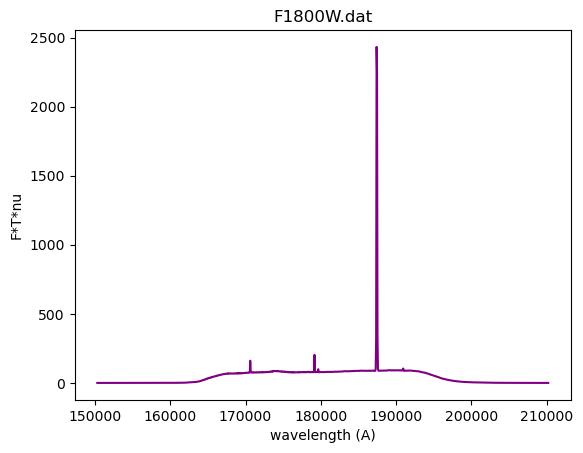

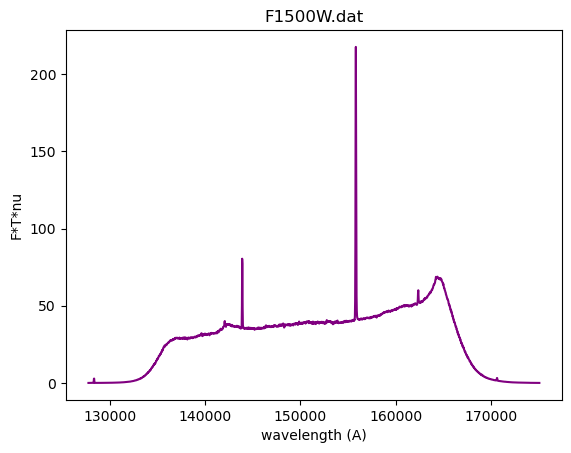

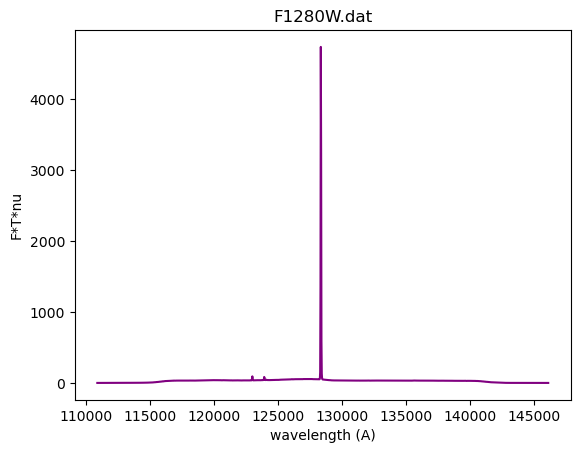

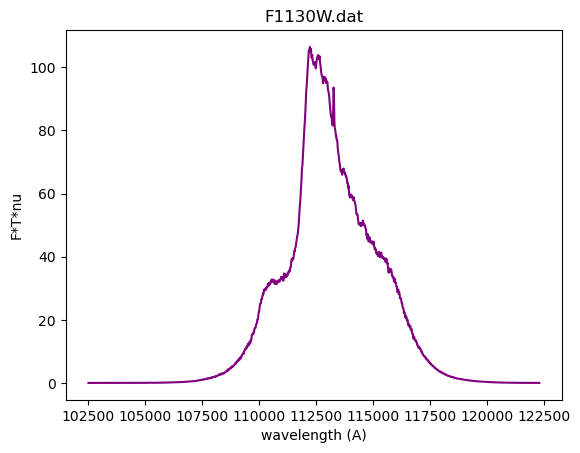

Set DATE-AVG to '2024-05-31T13:46:47.255' from MJD-AVG.
Set DATE-END to '2024-05-31T13:51:53.300' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.081922 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708040882.602 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 13150.94684699708 MJy
Total flux in aperture 2: 13544.812407300244 MJy
Total flux in aperture 3: 16900.38862338049 MJy, compare to expected 0.003038900979488818, ratio : 1.798124911331751e-07
Total flux in aperture 4: nan MJy


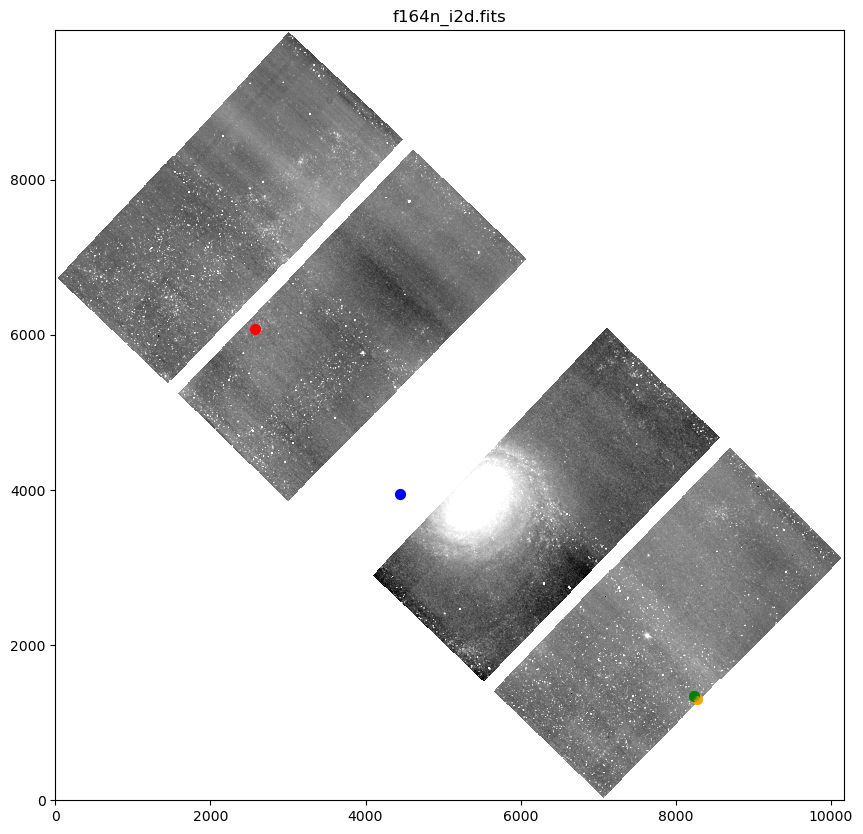

Set DATE-AVG to '2023-06-14T18:26:43.496' from MJD-AVG.
Set DATE-END to '2023-06-14T19:02:31.534' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -35.938385 from OBSGEO-[XYZ].
Set OBSGEO-H to 1721146417.406 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 7413.777414942448 MJy
Total flux in aperture 2: 8600.590259036424 MJy
Total flux in aperture 3: 14019.777228640973 MJy, compare to expected 0.002696803374341113, ratio : 1.923570774599627e-07
Total flux in aperture 4: 15709.640435785515 MJy


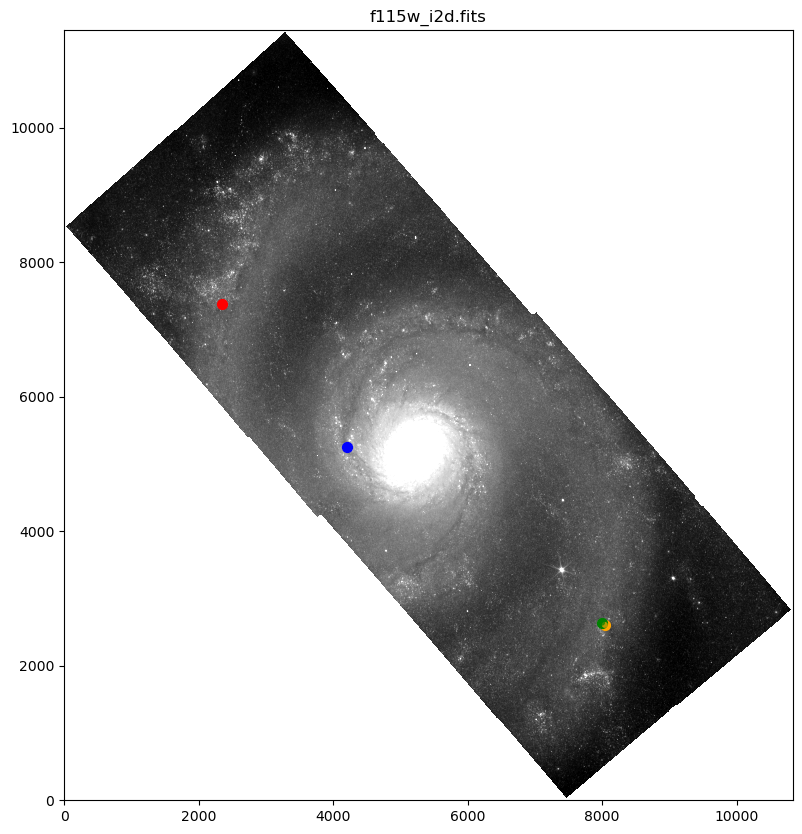

Set DATE-AVG to '2024-06-01T13:27:19.596' from MJD-AVG.
Set DATE-END to '2024-06-01T13:42:24.752' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.360950 from OBSGEO-[XYZ].
Set OBSGEO-H to 1709837637.033 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 8963.412771301084 MJy
Total flux in aperture 2: 9107.849953911367 MJy
Total flux in aperture 3: 13262.60329745786 MJy, compare to expected 0.002631258150705034, ratio : 1.9839680730022187e-07
Total flux in aperture 4: 16230.646106845992 MJy


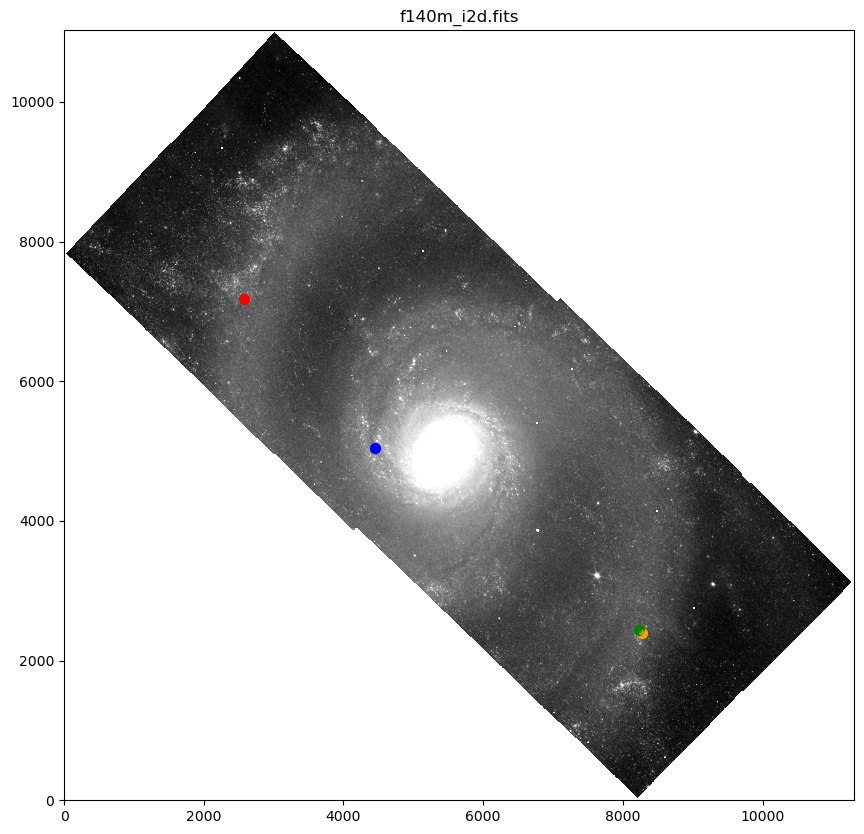

Set DATE-AVG to '2023-06-14T19:31:08.184' from MJD-AVG.
Set DATE-END to '2023-06-14T19:49:01.355' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -35.950777 from OBSGEO-[XYZ].
Set OBSGEO-H to 1721212852.647 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 9980.747252695845 MJy
Total flux in aperture 2: 9223.16736070615 MJy
Total flux in aperture 3: 13226.833066631632 MJy, compare to expected 0.0026671716048841253, ratio : 2.0164854213007405e-07
Total flux in aperture 4: 16815.897143742433 MJy


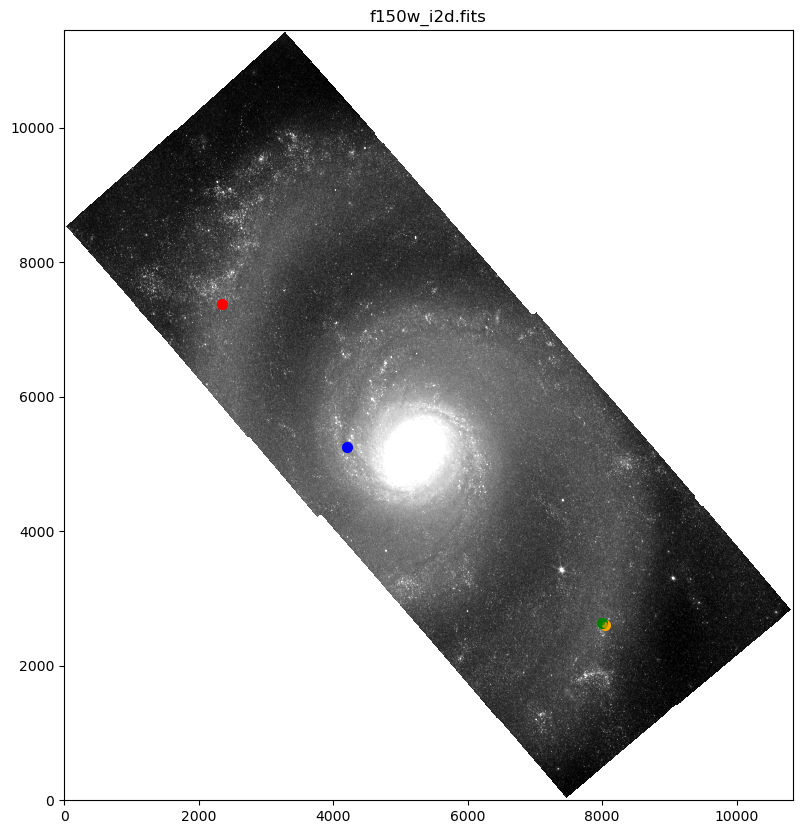

Set DATE-AVG to '2024-06-01T13:58:11.618' from MJD-AVG.
Set DATE-END to '2024-06-01T14:03:17.679' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.368902 from OBSGEO-[XYZ].
Set OBSGEO-H to 1709887439.726 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 20422.605190889364 MJy
Total flux in aperture 2: 15771.159835079397 MJy
Total flux in aperture 3: 17138.59212153514 MJy, compare to expected 0.0033189236809820005, ratio : 1.9365206065040057e-07
Total flux in aperture 4: nan MJy


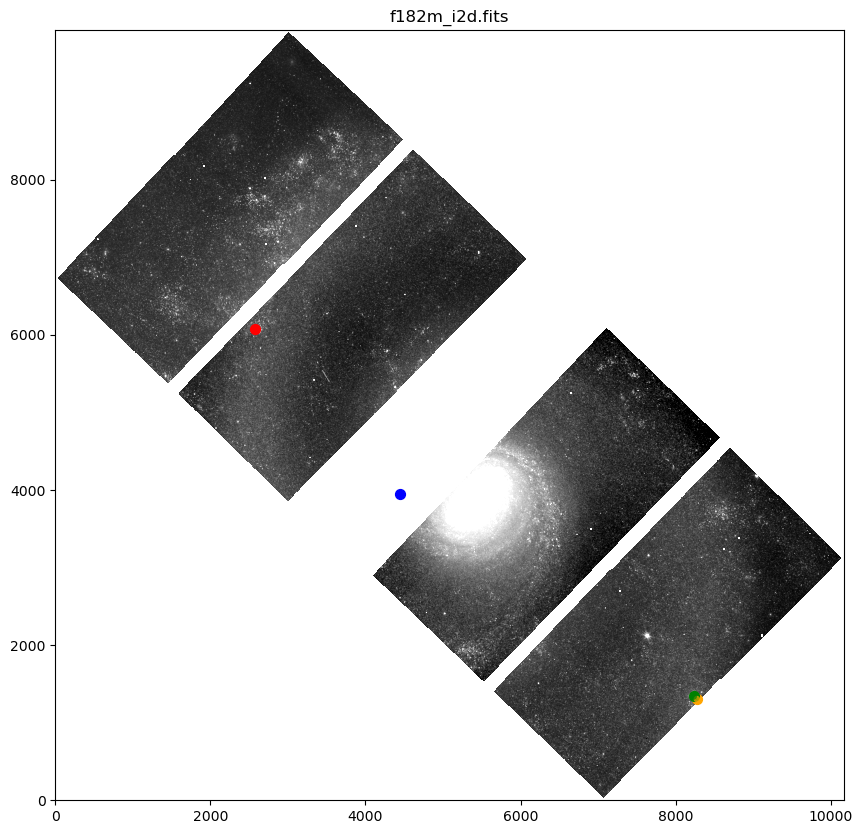

Set DATE-AVG to '2024-06-01T14:34:37.050' from MJD-AVG.
Set DATE-END to '2024-06-01T14:39:43.085' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.375987 from OBSGEO-[XYZ].
Set OBSGEO-H to 1709931755.781 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 14985.872655554285 MJy
Total flux in aperture 2: 11430.062268821886 MJy
Total flux in aperture 3: 15896.06827558157 MJy, compare to expected 0.0026412736622620997, ratio : 1.66158927885296e-07
Total flux in aperture 4: nan MJy


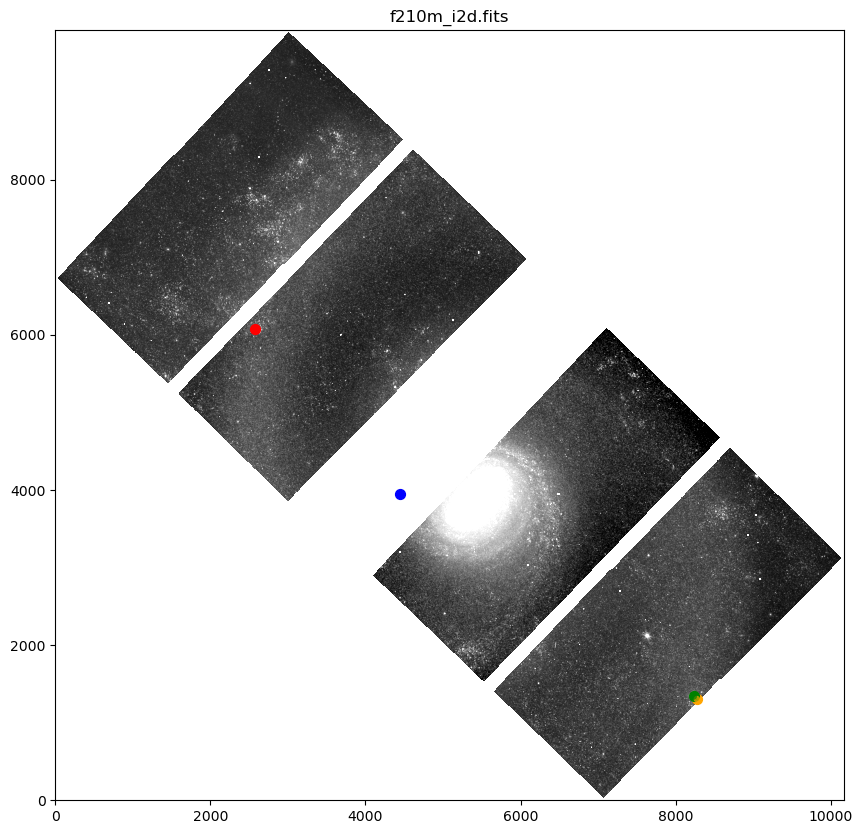

Set DATE-AVG to '2024-06-01T05:33:48.833' from MJD-AVG.
Set DATE-END to '2024-06-01T13:42:24.752' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.081922 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708040882.602 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 3887.6572912362244 MJy
Total flux in aperture 2: 2535.653602567936 MJy
Total flux in aperture 3: 2492.5647414255263 MJy, compare to expected 0.002172109488015864, ratio : 8.714355346186955e-07
Total flux in aperture 4: 4429.568820394333 MJy


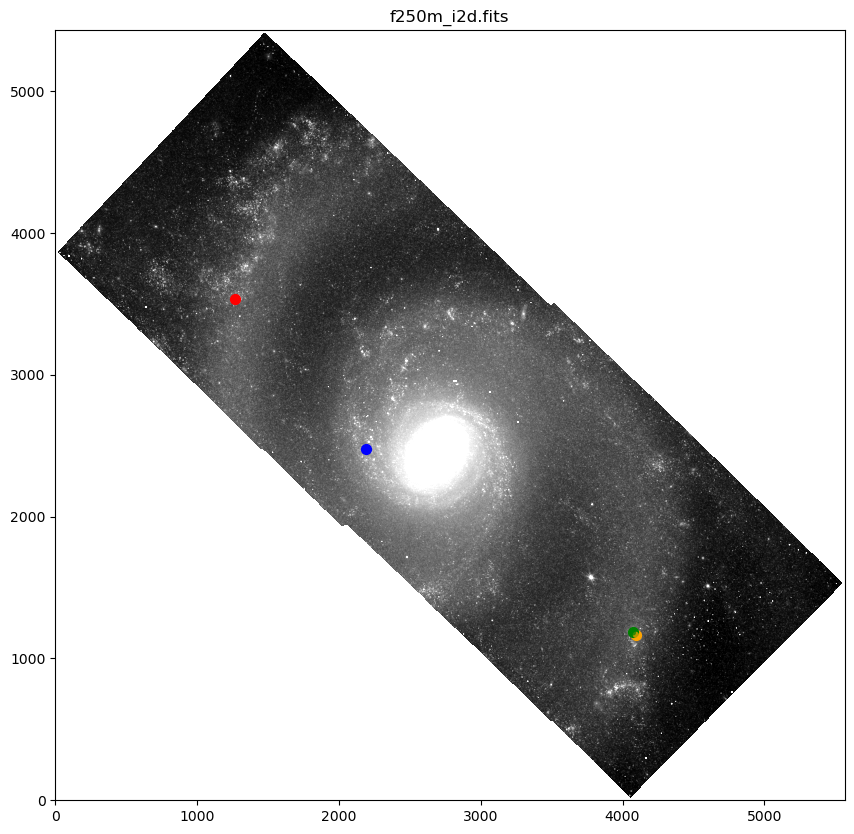

Set DATE-AVG to '2023-06-14T20:35:21.051' from MJD-AVG.
Set DATE-END to '2023-06-14T21:11:08.390' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -35.958281 from OBSGEO-[XYZ].
Set OBSGEO-H to 1721253181.761 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 19009.63951064991 MJy
Total flux in aperture 2: 14248.179510825174 MJy
Total flux in aperture 3: 15528.267019950326 MJy, compare to expected 0.00296292068173822, ratio : 1.9080820016371012e-07
Total flux in aperture 4: 21480.228642466558 MJy


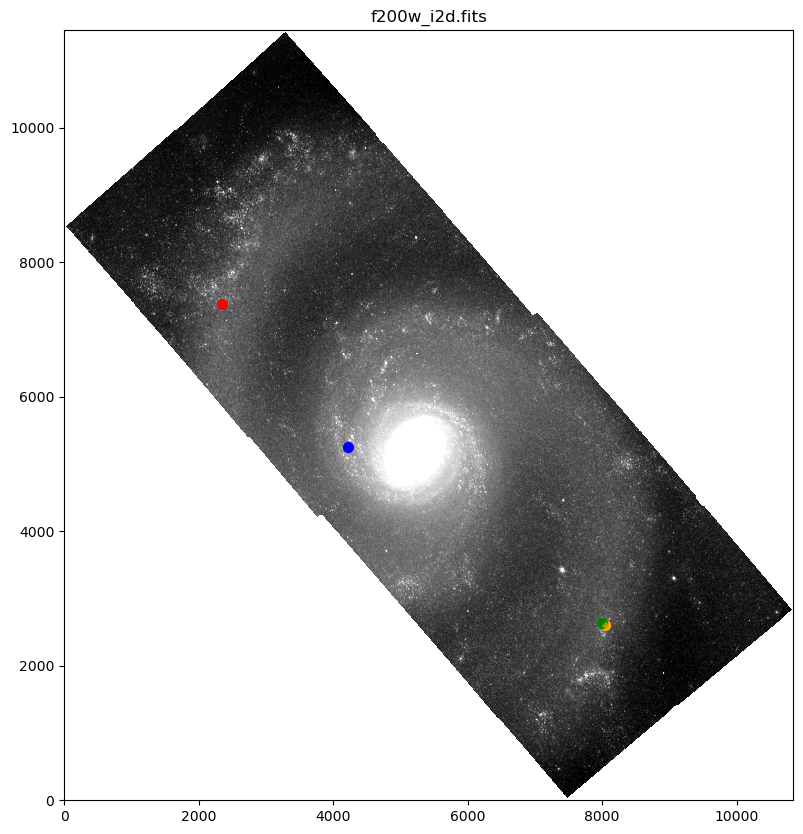

Set DATE-AVG to '2024-06-01T12:43:00.408' from MJD-AVG.
Set DATE-END to '2024-06-01T12:48:53.427' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.354134 from OBSGEO-[XYZ].
Set OBSGEO-H to 1709794902.230 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 14668.736035395259 MJy
Total flux in aperture 2: 13952.17650864999 MJy
Total flux in aperture 3: 15563.723064301783 MJy, compare to expected 0.0025885901854735176, ratio : 1.6632204099100926e-07
Total flux in aperture 4: nan MJy


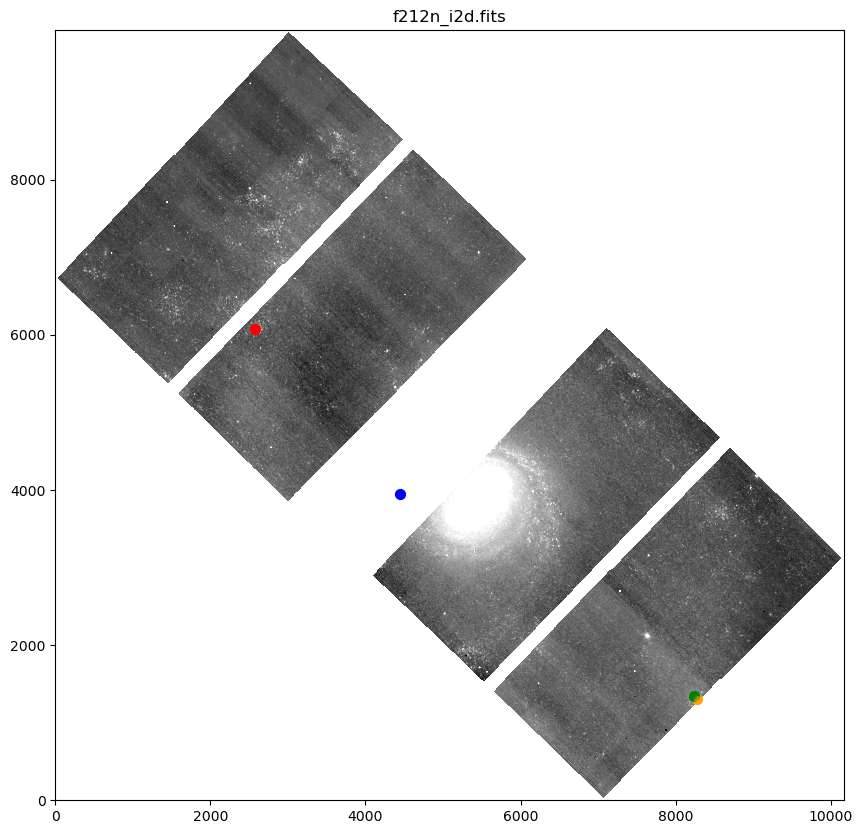

Set DATE-AVG to '2023-06-08T01:54:00.173' from MJD-AVG.
Set DATE-END to '2023-06-08T03:11:15.660' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -34.219321 from OBSGEO-[XYZ].
Set OBSGEO-H to 1710467029.601 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 107018.75468465337 MJy
Total flux in aperture 2: 79893.9129091224 MJy
Total flux in aperture 3: 61027.86861431372 MJy, compare to expected 0.009634155865023156, ratio : 1.5786485885504975e-07
Total flux in aperture 4: 75719.13577176869 MJy


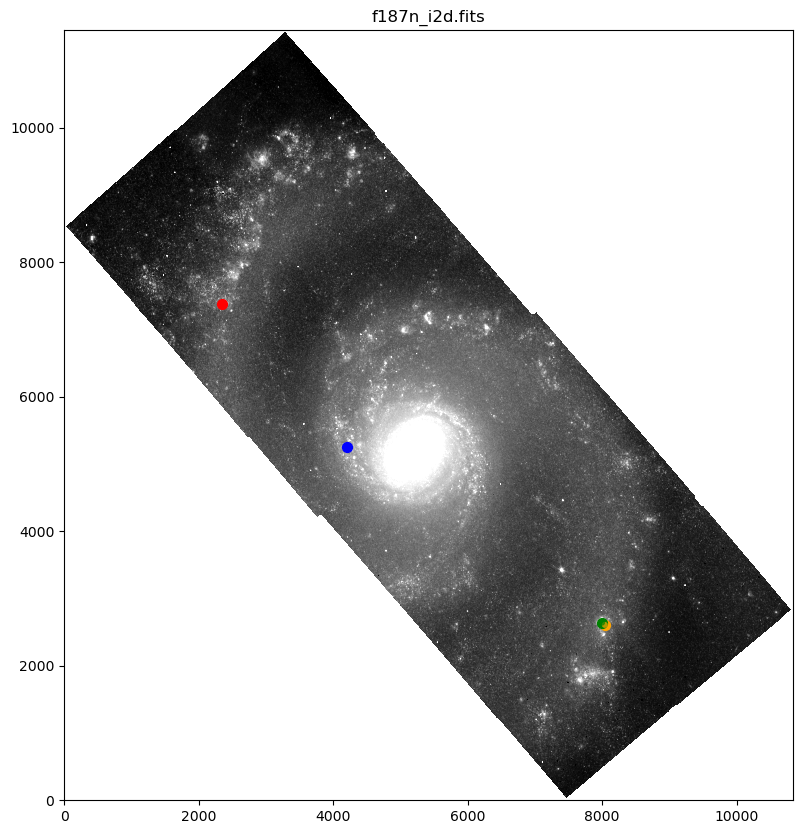

Set DATE-AVG to '2024-06-01T13:20:36.038' from MJD-AVG.
Set DATE-END to '2024-06-01T14:03:17.679' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.354134 from OBSGEO-[XYZ].
Set OBSGEO-H to 1709794902.230 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 8821.217474374256 MJy
Total flux in aperture 2: nan MJy
Total flux in aperture 3: 3658.0634516438527 MJy, compare to expected 0.003355925149845838, ratio : 9.174048493712594e-07
Total flux in aperture 4: nan MJy


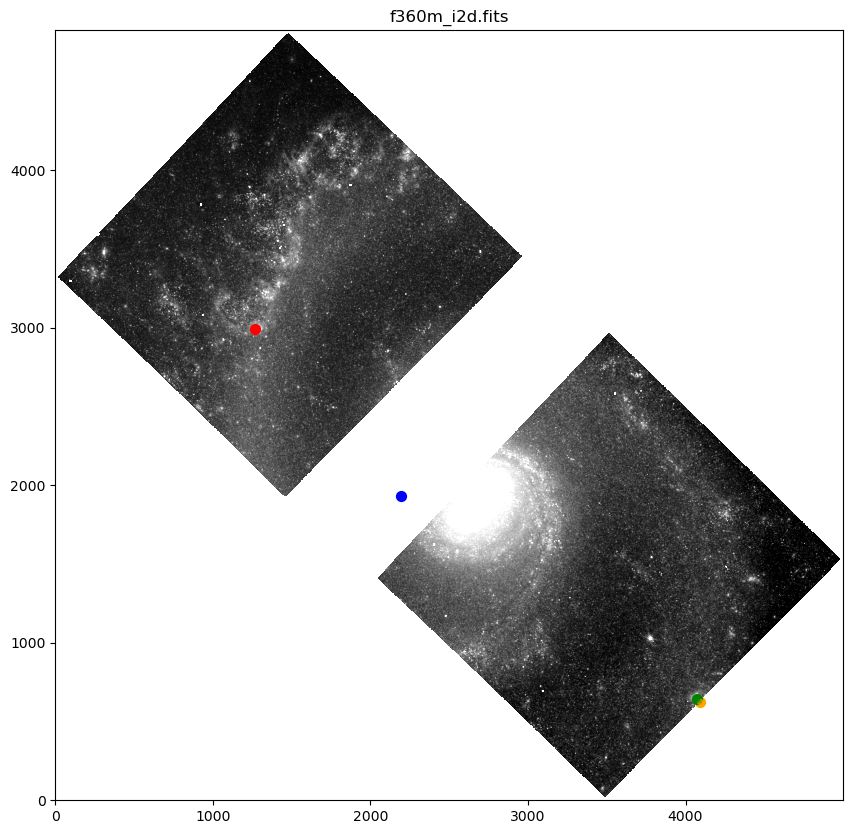

Set DATE-AVG to '2023-06-14T18:26:43.490' from MJD-AVG.
Set DATE-END to '2023-06-14T19:02:31.470' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -35.938385 from OBSGEO-[XYZ].
Set OBSGEO-H to 1721146417.406 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 12786.855095319497 MJy
Total flux in aperture 2: 8749.63862555386 MJy
Total flux in aperture 3: 5137.006957418342 MJy, compare to expected 0.004518026580108007, ratio : 8.795056377300665e-07
Total flux in aperture 4: 8955.554120678518 MJy


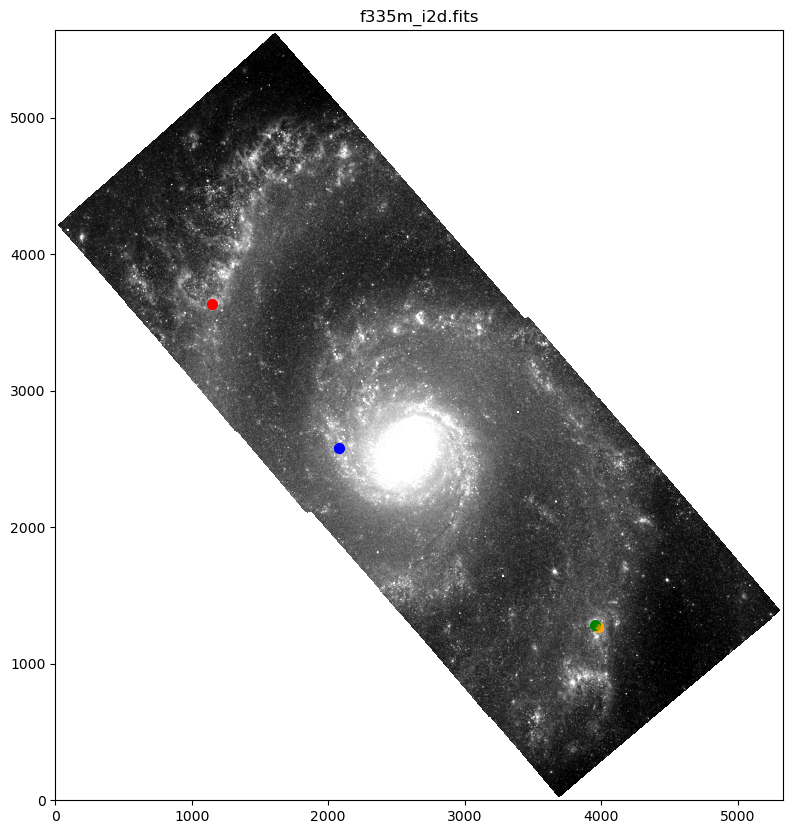

Set DATE-AVG to '2023-06-14T19:31:08.192' from MJD-AVG.
Set DATE-END to '2023-06-14T19:49:01.419' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -35.950777 from OBSGEO-[XYZ].
Set OBSGEO-H to 1721212852.647 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 4139.281836156019 MJy
Total flux in aperture 2: 2742.4234900485426 MJy
Total flux in aperture 3: 2665.0061773950997 MJy, compare to expected 0.0023239462501076437, ratio : 8.720228380030159e-07
Total flux in aperture 4: 4099.878563598048 MJy


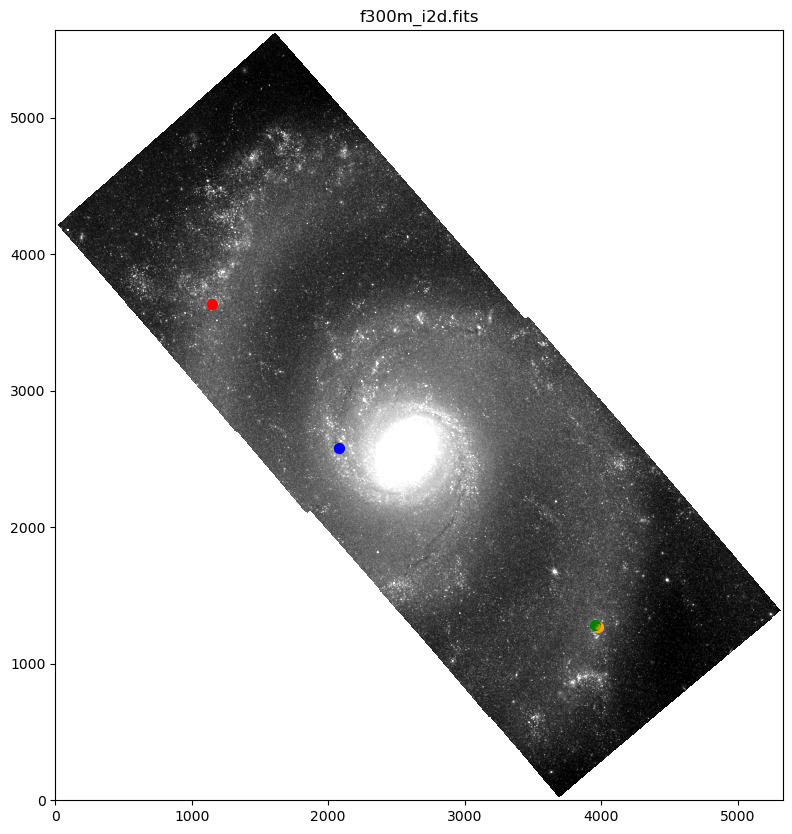

Set DATE-AVG to '2024-06-01T14:34:37.074' from MJD-AVG.
Set DATE-END to '2024-06-01T14:39:43.085' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.375987 from OBSGEO-[XYZ].
Set OBSGEO-H to 1709931755.781 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 9134.014035680182 MJy
Total flux in aperture 2: nan MJy
Total flux in aperture 3: 3559.1574575403356 MJy, compare to expected 0.003270292255063778, ratio : 9.188388808523839e-07
Total flux in aperture 4: nan MJy


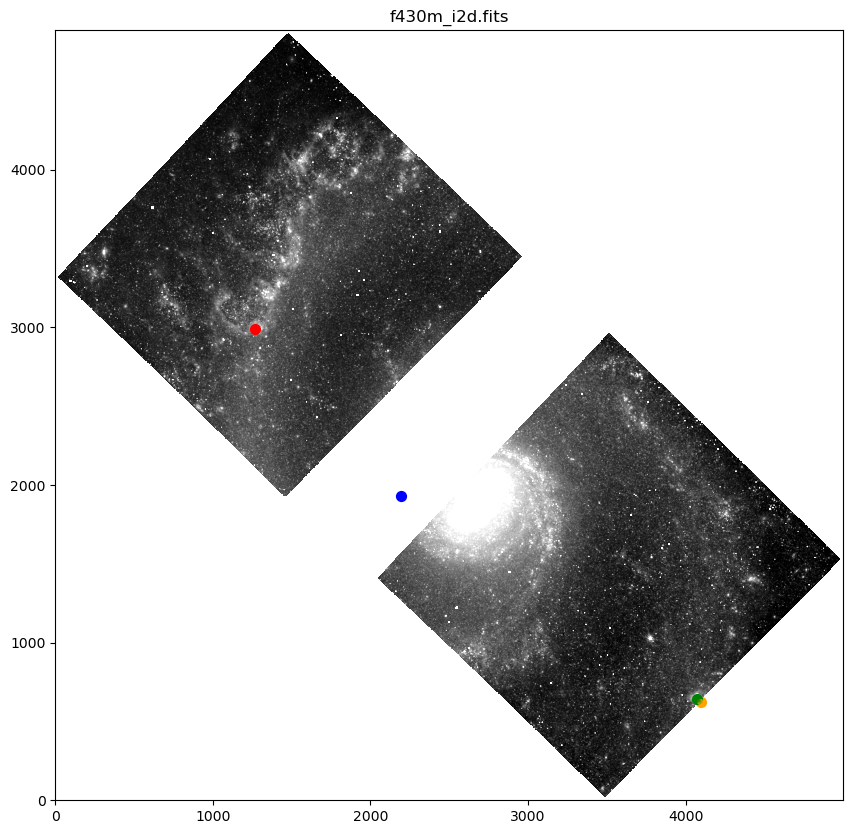

Set DATE-AVG to '2023-06-08T01:54:00.193' from MJD-AVG.
Set DATE-END to '2023-06-08T03:11:15.660' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -34.219321 from OBSGEO-[XYZ].
Set OBSGEO-H to 1710467029.601 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 28521.855847779163 MJy
Total flux in aperture 2: 17405.66335934583 MJy
Total flux in aperture 3: 10711.108587920351 MJy, compare to expected 0.008492693362263702, ratio : 7.928864965332807e-07
Total flux in aperture 4: 18000.53531083539 MJy


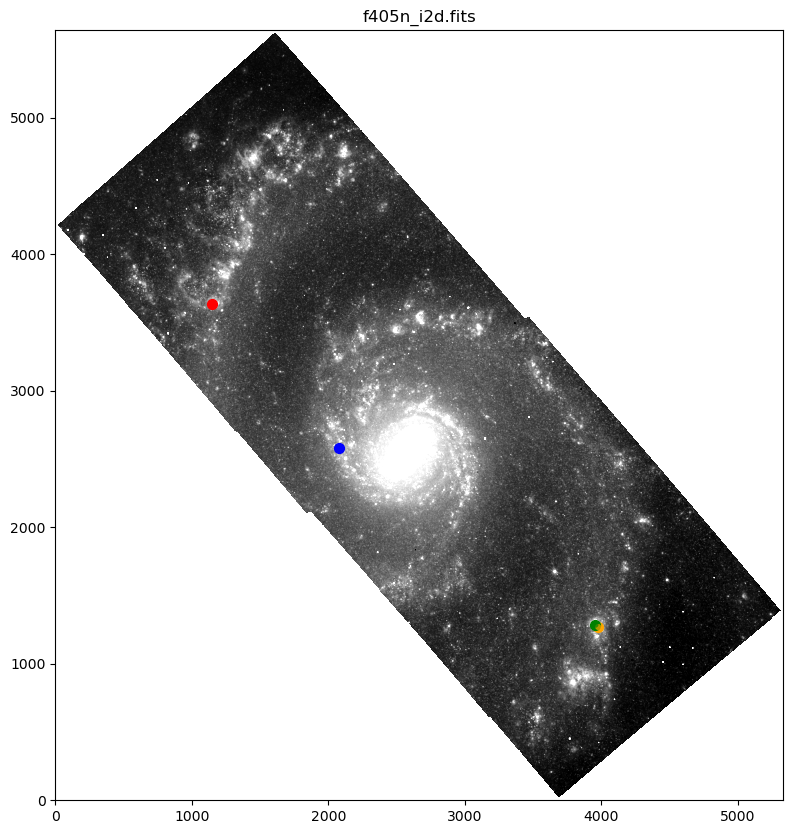

Set DATE-AVG to '2023-06-14T20:35:21.059' from MJD-AVG.
Set DATE-END to '2023-06-14T21:11:08.390' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -35.958281 from OBSGEO-[XYZ].
Set OBSGEO-H to 1721253181.761 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 10241.154399745985 MJy
Total flux in aperture 2: 6410.081048407683 MJy
Total flux in aperture 3: 4025.2777171791563 MJy, compare to expected 0.003521743234104325, ratio : 8.749068962556701e-07
Total flux in aperture 4: 8535.615257581945 MJy


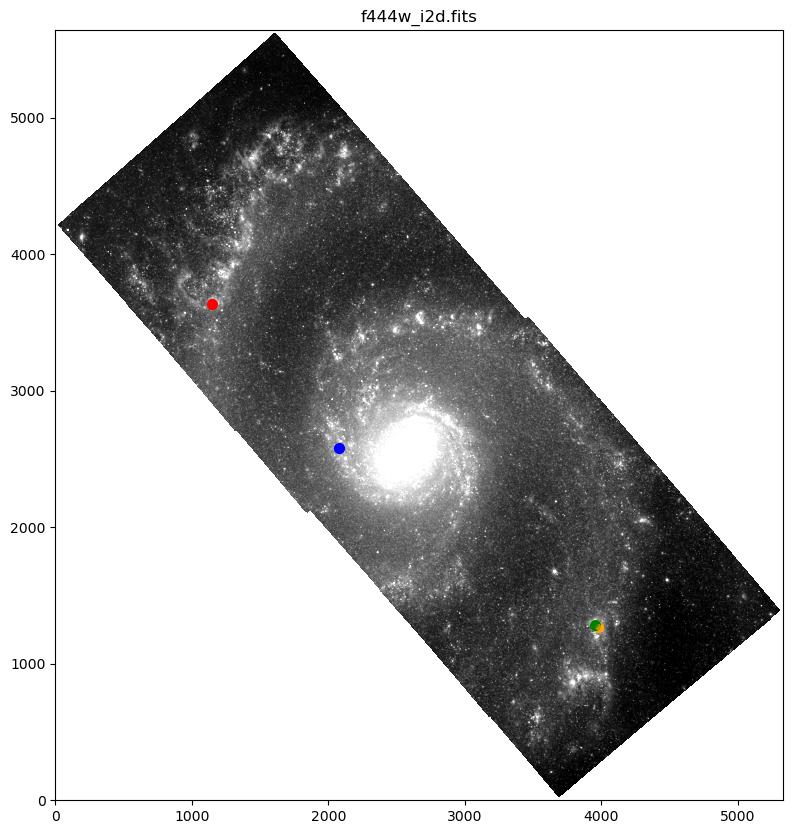

Set DATE-AVG to '2024-05-31T17:39:19.434' from MJD-AVG.
Set DATE-END to '2024-05-31T20:13:08.478' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.098648 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708151795.253 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 472659.74530761584 MJy
Total flux in aperture 2: 130395.18707373837 MJy
Total flux in aperture 3: 61215.20646661107 MJy, compare to expected 0.13277965557753282, ratio : 2.1690632645330622e-06
Total flux in aperture 4: 167191.00089065311 MJy


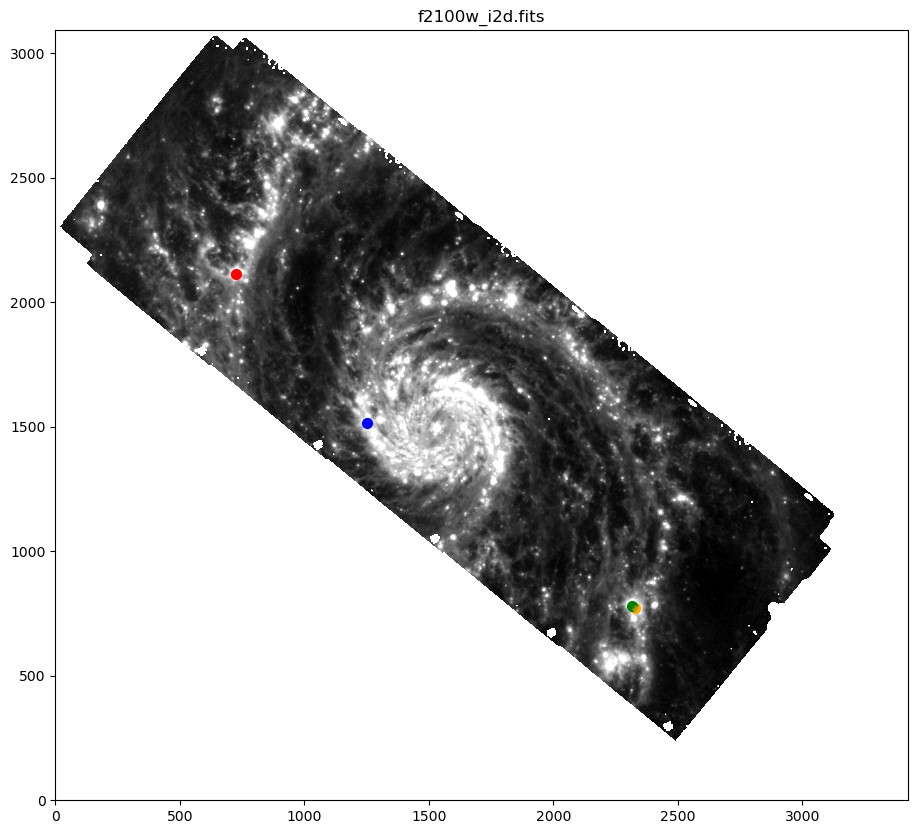

Set DATE-AVG to '2024-05-31T06:28:14.471' from MJD-AVG.
Set DATE-END to '2024-05-31T19:18:03.329' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.087505 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708077953.592 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 28878.16057344826 MJy
Total flux in aperture 2: 13599.226769977173 MJy
Total flux in aperture 3: 6308.7836229438 MJy, compare to expected 0.01573054518419627, ratio : 2.493435521704594e-06
Total flux in aperture 4: 16841.562327863954 MJy


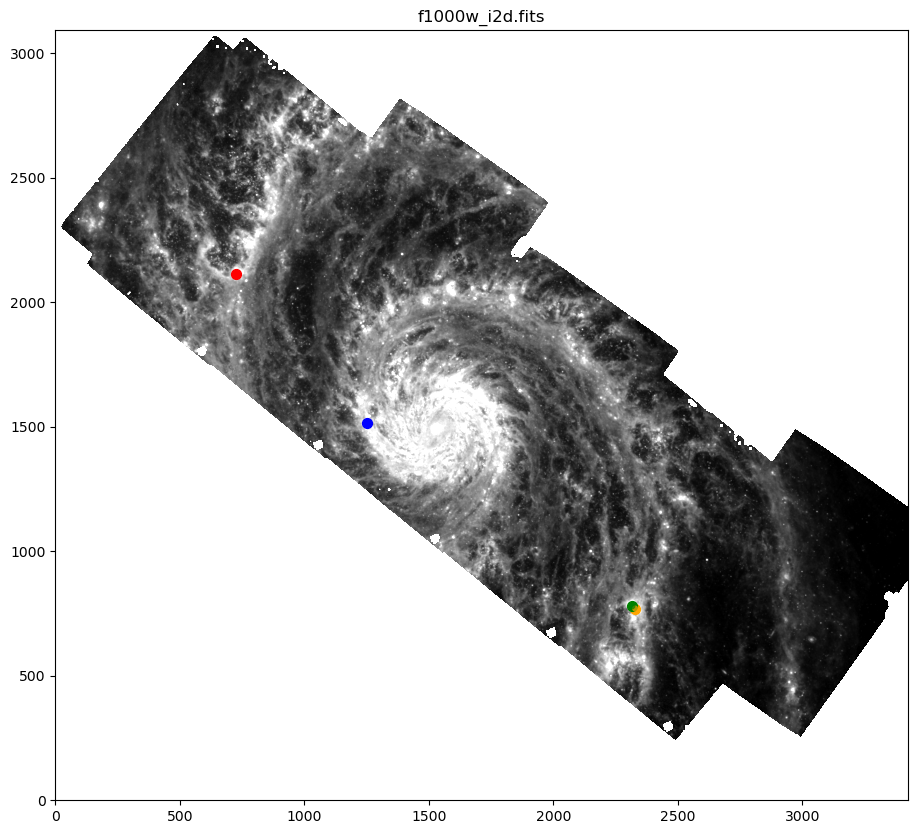

Set DATE-AVG to '2023-06-09T03:26:29.255' from MJD-AVG.
Set DATE-END to '2023-06-09T04:43:05.778' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -34.518311 from OBSGEO-[XYZ].
Set OBSGEO-H to 1712844718.141 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 9268.122800133375 MJy
Total flux in aperture 2: 6064.005665473738 MJy
Total flux in aperture 3: 2788.0899987130274 MJy, compare to expected 0.00909845356178365, ratio : 3.263328503019438e-06
Total flux in aperture 4: 6705.140177687739 MJy


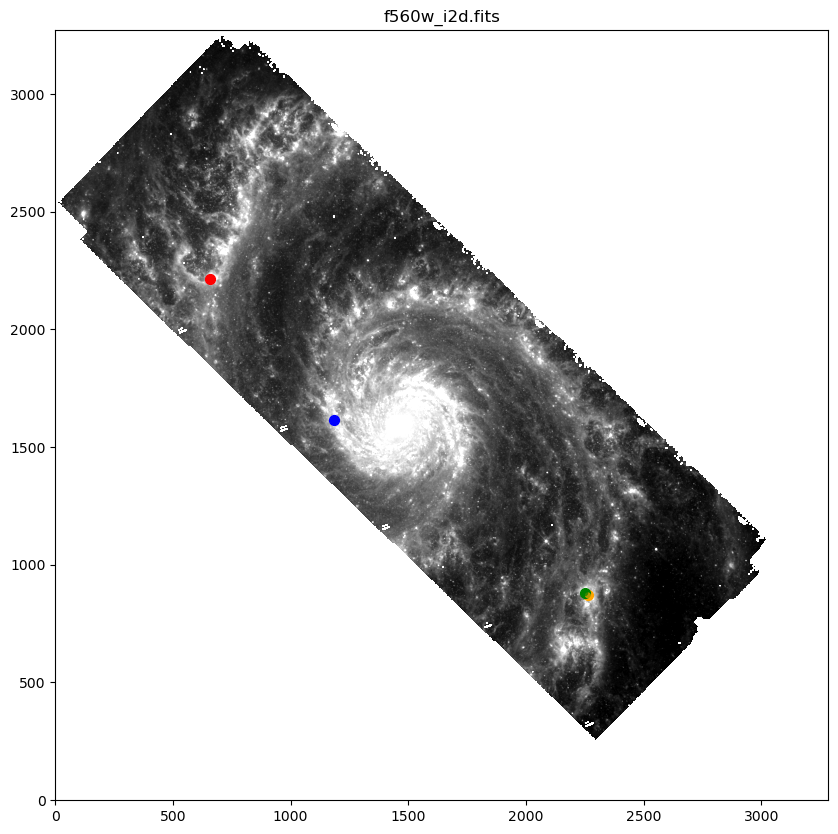

Set DATE-AVG to '2024-02-16T03:56:56.087' from MJD-AVG.
Set DATE-END to '2024-05-31T08:40:27.750' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -34.521079 from OBSGEO-[XYZ].
Set OBSGEO-H to 1712865276.909 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 59005.506648075454 MJy
Total flux in aperture 2: 38284.66386654065 MJy
Total flux in aperture 3: 16224.248311580832 MJy, compare to expected 0.0411692495127088, ratio : 2.5375135243290306e-06
Total flux in aperture 4: 38099.61203771424 MJy


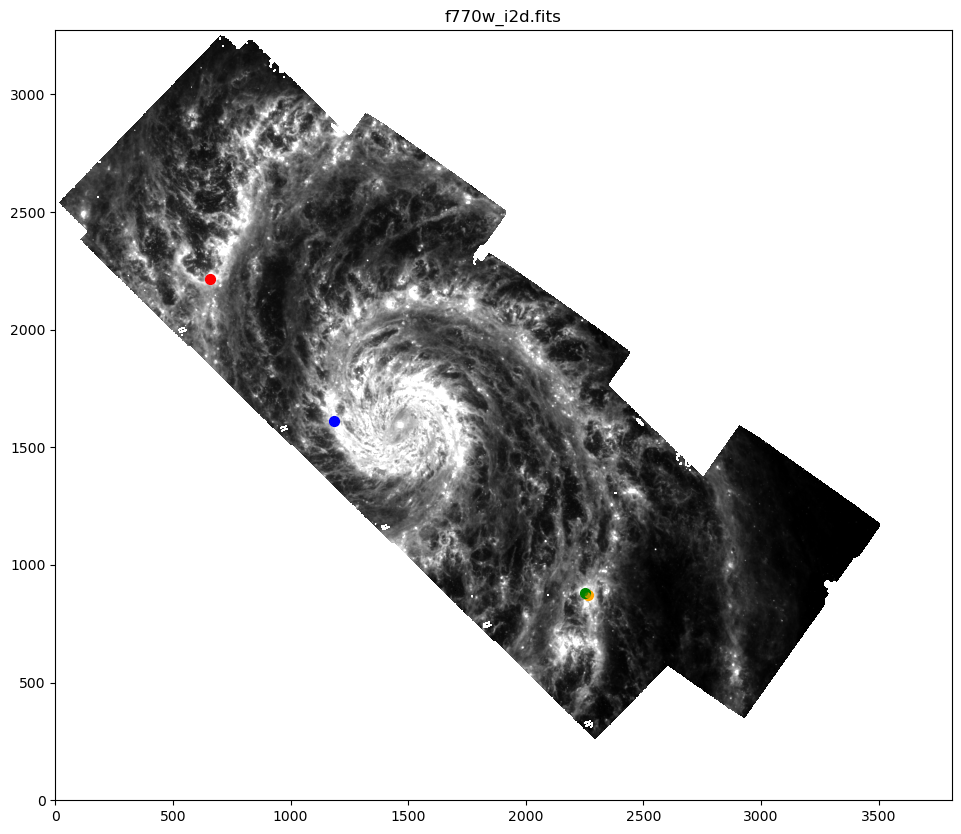

Set DATE-AVG to '2024-05-31T17:28:21.870' from MJD-AVG.
Set DATE-END to '2024-05-31T20:02:10.750' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.096423 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708137063.536 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 205938.12496432714 MJy
Total flux in aperture 2: 91681.59474317616 MJy
Total flux in aperture 3: 39584.21582098893 MJy, compare to expected 0.09018632106270306, ratio : 2.278340474661699e-06
Total flux in aperture 4: 115458.89424808437 MJy


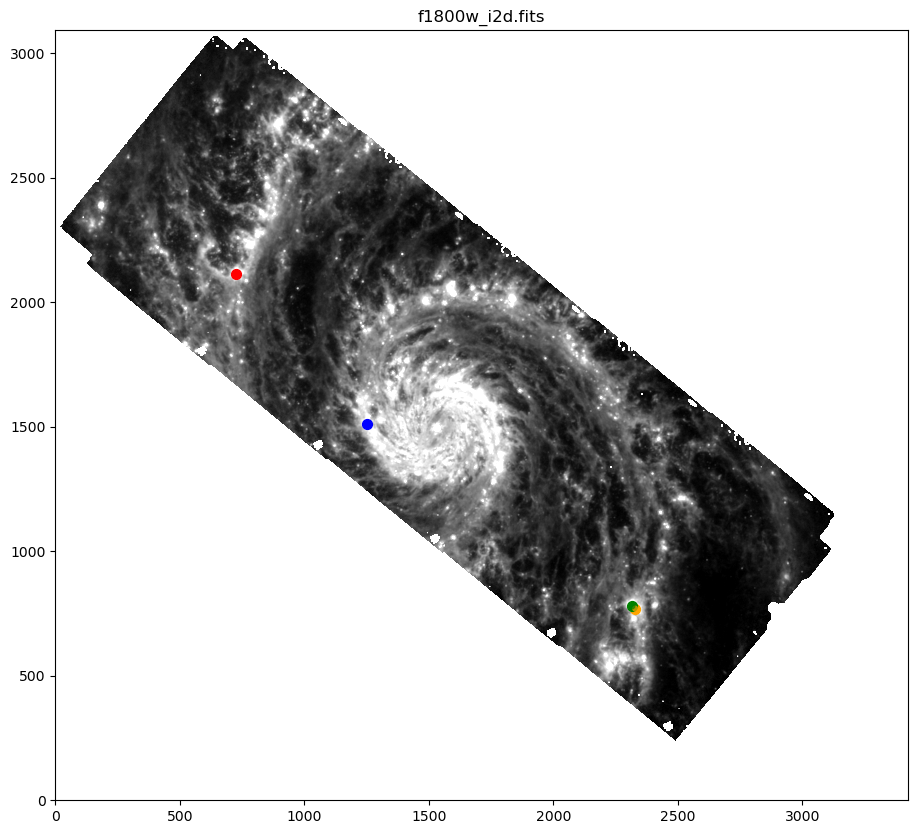

Set DATE-AVG to '2024-05-31T17:17:21.675' from MJD-AVG.
Set DATE-END to '2024-05-31T19:51:21.407' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.094187 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708122257.728 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 108542.96862545266 MJy
Total flux in aperture 2: 45061.64774935148 MJy
Total flux in aperture 3: 17245.812739437537 MJy, compare to expected 0.040774479361494684, ratio : 2.3643118464490833e-06
Total flux in aperture 4: 57963.15537622468 MJy


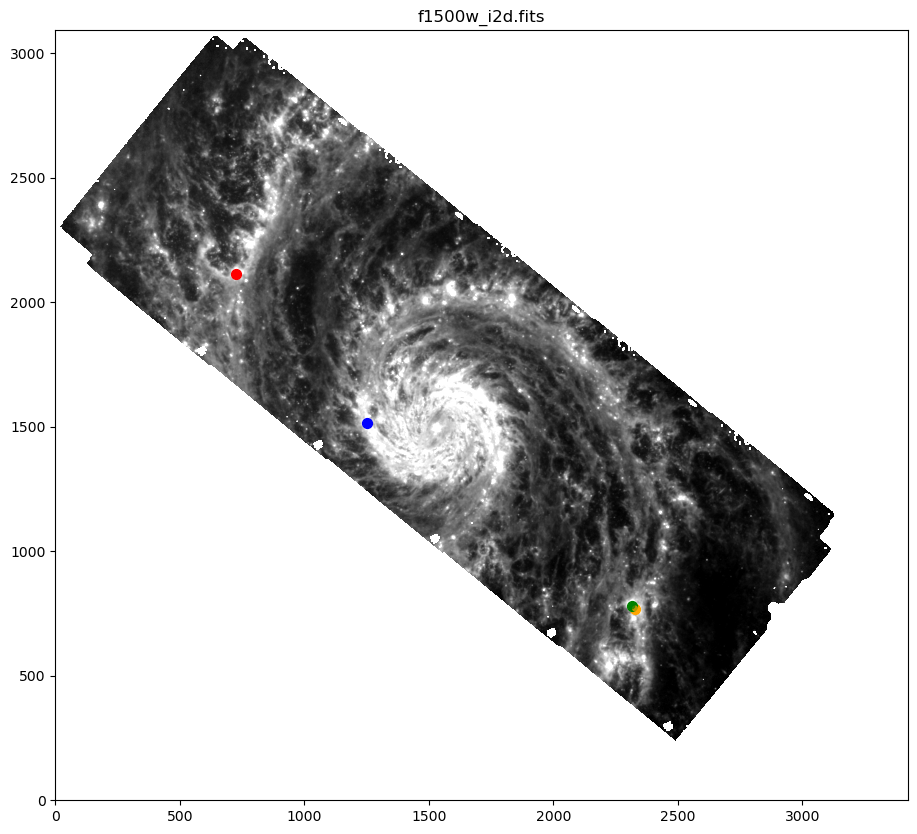

Set DATE-AVG to '2024-05-31T05:44:16.777' from MJD-AVG.
Set DATE-END to '2024-05-31T19:40:09.792' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.091923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708107255.635 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 98722.55481859835 MJy
Total flux in aperture 2: 46042.56975425563 MJy
Total flux in aperture 3: 19078.97176030445 MJy, compare to expected 0.04537148581161971, ratio : 2.3780886298086173e-06
Total flux in aperture 4: 56053.66680416404 MJy


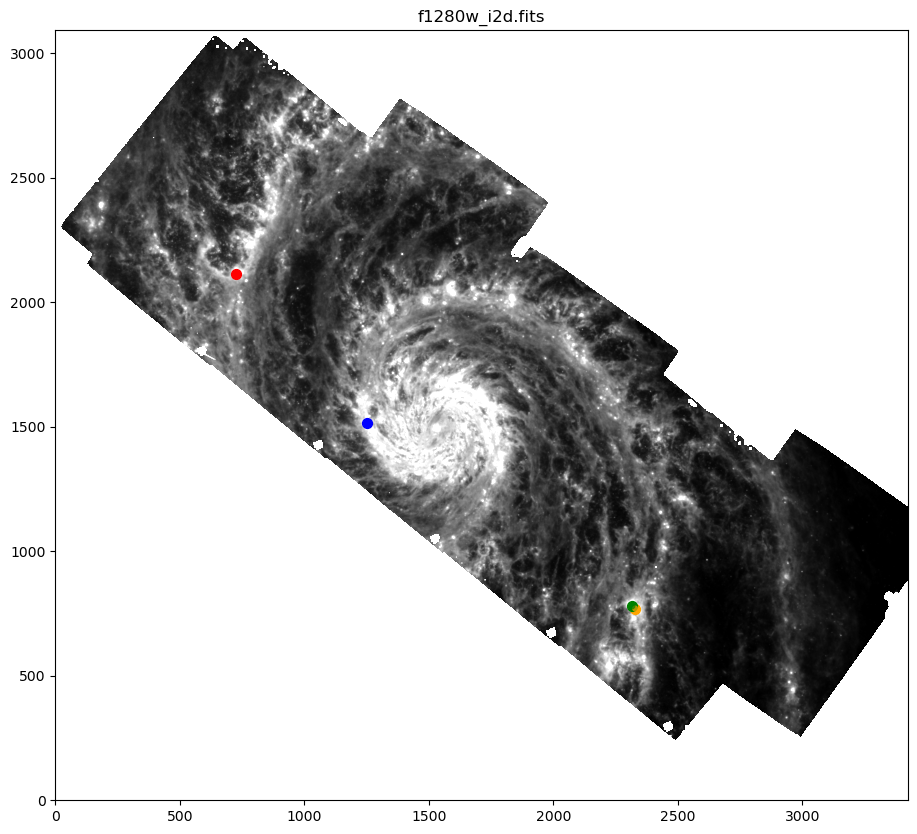

Set DATE-AVG to '2024-05-31T16:55:03.526' from MJD-AVG.
Set DATE-END to '2024-05-31T19:29:06.560' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -33.089761 from OBSGEO-[XYZ].
Set OBSGEO-H to 1708092918.490 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Total flux in aperture 1: 79025.21412481365 MJy
Total flux in aperture 2: 44779.94970715302 MJy
Total flux in aperture 3: 19576.950300473814 MJy, compare to expected 0.050076831222125, ratio : 2.557948528934714e-06
Total flux in aperture 4: 46216.83533456169 MJy


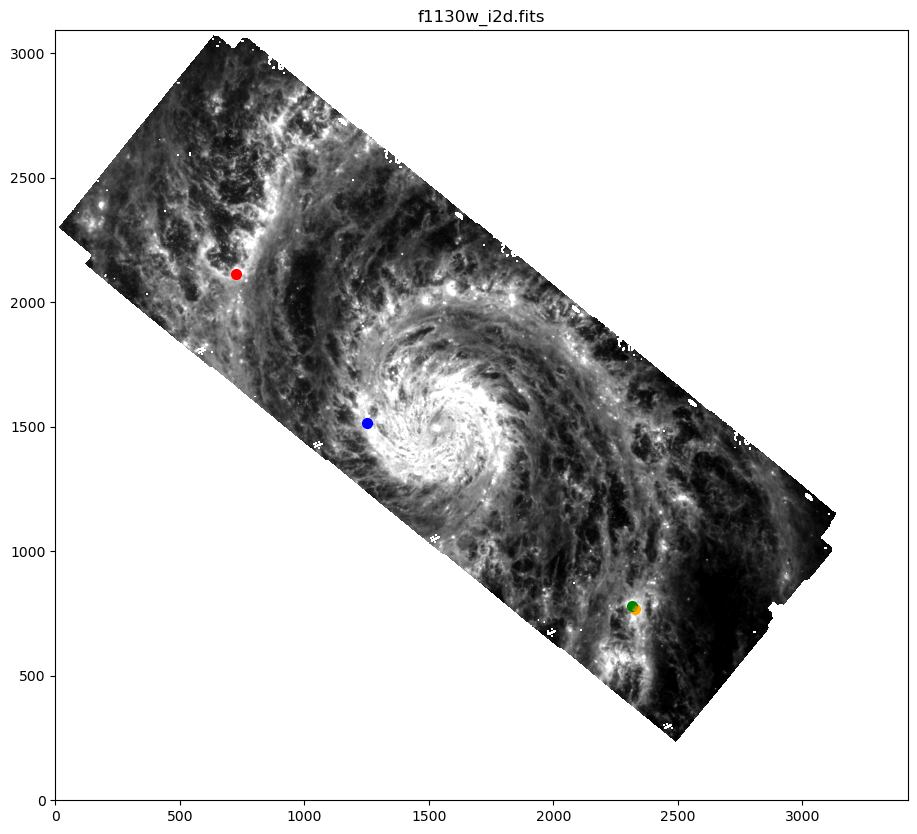

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import sys
from astropy.io import fits
from astropy.visualization import simple_norm, imshow_norm
from ipywidgets import interact, Dropdown
from astropy.wcs import WCS

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..'))) #TJ change directory to include the entire ASTRO5160 directory
from Py_files.Basic_analysis import *
def import_data_and_sort_by_wavelength(file_path):
    '''import data and sort by wavelength
    -------------
    Parameters
    -------------
    file_path : type = str - path to file with data
    
    Returns
    -------------
    structured array ('wavelength', 'intensity', 'uncertainty', 'mask', 'note')
    '''    
    with open(file_path, 'r') as file:
        header = file.readline().strip().split()
        if ((len(header) == 3) & (type(try_float(header[0])) == type(0.1)) & (type(try_float(header[1])) == type(0.1)) & (type(try_float(header[2])) == type(0.1))):
            data_list = []
            data_list.append((try_float(header[0]), try_float(header[1]), try_float(header[2])))
            for line in file:
                parts = line.strip().split(maxsplit=3)
                
                # Convert only numeric columns to floats
                wavelength = float(parts[0]) #TJ required for sorting
                intensity = try_float(parts[1])
                uncertainty = try_float(parts[2])
                
                data_list.append((wavelength, intensity, uncertainty))
        
            # Define dtype with notes as string
            dtype = [
                ('wavelength', float),
                ('intensity', float),
                ('uncertainty', float),
            ]
            
            data = np.array(data_list, dtype=dtype)
            sorted_data = np.sort(data, order=['wavelength'])  # Sort by wavelength
            
            return sorted_data
        elif len(header) == 5:
            data_list = []
            for line in file:
                parts = line.strip().split(maxsplit=4)
                
                # Ensure exactly 5 parts (pad missing values with empty strings)
                parts = parts + [''] * (5 - len(parts))
                
                # Convert only numeric columns to floats
                wavelength = float(parts[0])  # Required for sorting
                intensity = try_float(parts[1])
                uncertainty = try_float(parts[2])
                mask = try_float(parts[3])
                notes = parts[4].strip()  # Keep as string, strip whitespace
                
                data_list.append((wavelength, intensity, uncertainty, mask, notes))
        
        # Define dtype with notes as string
        dtype = [
            ('wavelength', float),
            ('intensity', float),
            ('uncertainty', float),
            ('mask', float),
            ('notes', 'U256')  # Unicode string (max length 256)
        ]
        
        data = np.array(data_list, dtype=dtype)
        sorted_data = np.sort(data, order=['wavelength'])  # Sort by wavelength
        
        return sorted_data

# Step 1: Extract filter names (e.g., "f164n" from .fits, "F070M" from .dat)
def extract_filter_name(filename):
    # For .fits files: ngc5194_nircam_1v3_f164n_i2d.fits → "f164n"
    if filename.endswith('.fits'):
        parts = os.path.basename(filename).split('_')
        for part in parts:
            if part.startswith('f') and part[1:].replace('n', '').replace('w', '').replace('m', '').isdigit():
                return part.lower()
    # For .dat files: F070M.dat → "f070m"
    elif filename.endswith('.dat'):
        return os.path.splitext(os.path.basename(filename))[0].lower()
    return None



def generate_list_of_files():
        
    filter_directory = '/d/crow1/tools/cigale/database_builder/filters/jwst/'
    path = ['nircam', 'miri']
    filter_files = np.concatenate([glob.glob(os.path.join(filter_directory + file_path, "*.dat")) for file_path in path])
    image_directory = 'Data_files/Image_files'
    image_files = glob.glob(os.path.join(image_directory, "*.fits"))
    # Initialize aligned lists
    image_file_array = []
    filter_file_array = []
    
    # Loop through .fits files and find matching .dat files
    for fits_file in image_files:
        fits_filter = extract_filter_name(fits_file)
        if not fits_filter:
            continue  # Skip if no filter name found
        
        # Search for matching .dat file
        for dat_file in filter_files:
            dat_filter = extract_filter_name(dat_file)
            if dat_filter == fits_filter:
                image_file_array.append(fits_file)
                filter_file_array.append(dat_file)
                break  # Stop searching after first match
    return image_file_array, filter_file_array
image_files, filter_files = generate_list_of_files()

#SED_filepath = 'Data_files/ARM2_HII2_conv_stitched_test.dat' #TJ switch to this one and rerun to get the convolved array
SED_filepath = 'Data_files/ARM2_HII2_stitch.dat'
SED_data = import_data_and_sort_by_wavelength(SED_filepath)
IFU_filepath = 'Data_files/IFU_files/M51_SW_f290lp_g395m-f290lp_s3d.fits'
hdul = fits.open(IFU_filepath)
IFU_data = hdul['SCI'].data  # flux in MJy/sr or μJy/arcsec²
IFU_header = hdul['SCI'].header
tldl_array = []
filter_data_array = []
for file in filter_files:
    data = []
    with open(file, 'r') as f:
            header = f.readline().strip().split()
            for line in f:
                data_line = line.strip().split()
                data.append(data_line)
            
    header, filter_T = data[:2], np.array(data[2:])
    wl = [try_float(filter_T[i,0]) for i in range(len(filter_T))]
    T = [try_float(filter_T[i,1]) for i in range(len(filter_T))]
    filter_data_array.append([wl, T])
    tldl = np.trapz(T, wl)
    tldl_array.append(tldl)



expected_flux_array = []
for i, filter_data in enumerate(filter_data_array):
    first_wl = filter_data[0][0]
    last_wl = filter_data[0][-1]
    relevent_SED_wl = SED_data['wavelength'][((SED_data['wavelength']*1e+4 > first_wl) & (SED_data['wavelength']*1e+4 < last_wl))]*1e+4
    relevent_SED_flux = SED_data['intensity'][((SED_data['wavelength']*1e+4 > first_wl) & (SED_data['wavelength']*1e+4 < last_wl))]
    diff = np.abs(relevent_SED_wl[:, np.newaxis] - filter_data[0])
    closest_idx = np.argmin(diff, axis=1)
    T_at_wl = [filter_data[1][x] for x in closest_idx]
    F_T = [relevent_SED_flux[o]*T_at_wl[o] for o in range(len(T_at_wl))]
    numerator = np.trapz(F_T, relevent_SED_wl)
    denominator = tldl_array[i]
    expected_flux_array.append((numerator/denominator)/IFU_header["XPOSURE"])
    
    show_SED = False
    show_filter = False
    show_filter_pass = True
    
    if numerator !=0:
    
        if show_filter:
            plt.plot(filter_data[0], filter_data[1], color = 'blue')
            plt.xlabel('wavelength (A)')
            plt.ylabel('T (%)')
            plt.title('filter transmission')
            plt.show()
        if show_SED:
            plt.plot(relevent_SED_wl, relevent_SED_flux, color = 'red')
            plt.xlabel('wavelength (A)')
            plt.ylabel('F*nu')
            plt.title('SED flux')
            plt.show()

        if show_filter_pass:
            plt.plot(relevent_SED_wl, F_T, color = 'purple')
            plt.xlabel('wavelength (A)')
            plt.ylabel('F*T*nu')
            plt.title(f'{filter_files[i].split("/")[-1]}')
            plt.show()

#TJ on big beautiful cell for photometric

#TJ this cell gets the actual photometry data from Tony's files
# to get new files run at the command line:
#rclone copy m51_g_drive:/Data/GO3435/MIRI/Tony_reduction/v0p2/ /d/ret1/Taylor/jupyter_notebooks/Research/Data_files --include "*.fits"

from astropy.io import fits
from photutils.aperture import CircularAperture, aperture_photometry
import astropy.units as u
from astropy.wcs import WCS

'''
Draine info on regions, radius = 0.750 arcseconds
202.5062429  47.2143358  0.750  ARM1_HII
202.4335225  47.1729608  0.750  ARM2_HII1
202.4340450  47.1732517  0.750  ARM2_HII2 #TJ my region SW2 region
202.4823742  47.1958589  0.750  ARM3_HII
'''
# Define aperture (RA, Dec in degrees, radius in arcseconds)
arm1h_loc = [202.5062429, 47.2143358]
arm2h1_loc = [202.4335225, 47.1729608]
arm2h2_loc = [202.4340450, 47.1732517]
arm3h_loc = [202.4823742, 47.1958589]
filter_name_array = [f.split("/")[-1] for f in filter_files]
obs_flux_array = []
for i, file in enumerate(image_files):
    hdul = fits.open(file)
    data = hdul['SCI'].data  # flux in MJy/sr or μJy/arcsec²
    header = hdul['SCI'].header
    exp_time = header['XPOSURE']
    wcs = WCS(header)
    radius = 0.75 * u.arcsec
    radius_pixels = (radius).to_value(u.deg) / abs(header['CDELT2'])
    
    
    # Convert RA/Dec to pixel coordinates
    x1, y1 = wcs.all_world2pix(arm1h_loc[0], arm1h_loc[1], 0)
    x2, y2 = wcs.all_world2pix(arm2h1_loc[0], arm2h1_loc[1], 0)
    x3, y3 = wcs.all_world2pix(arm2h2_loc[0], arm2h2_loc[1], 0)
    x4, y4 = wcs.all_world2pix(arm3h_loc[0], arm3h_loc[1], 0)
    aperture1 = CircularAperture((x1, y1), r=radius.to_value(u.deg) / header['CDELT2'])
    aperture2 = CircularAperture((x2, y2), r=radius.to_value(u.deg) / header['CDELT2'])
    aperture3 = CircularAperture((x3, y3), r=radius.to_value(u.deg) / header['CDELT2'])
    aperture4 = CircularAperture((x4, y4), r=radius.to_value(u.deg) / header['CDELT2'])
    
    # Perform aperture photometry
    phot_result1 = aperture_photometry(data, aperture1)
    phot_result2 = aperture_photometry(data, aperture2)
    phot_result3 = aperture_photometry(data, aperture3)
    phot_result4 = aperture_photometry(data, aperture4)
    total_flux1 = phot_result1['aperture_sum'][0]  # in image units
    total_flux2 = phot_result2['aperture_sum'][0]  # in image units
    total_flux3 = phot_result3['aperture_sum'][0]  # in image units
    total_flux4 = phot_result4['aperture_sum'][0]  # in image units
    
    # Apply unit conversion if needed (e.g., MJy/sr → μJy)
    pixel_area = (header['CDELT2'] * u.deg.to(u.arcsec))**2  # arcsec² per pixel
    total_flux_Mjy1 = total_flux1
    total_flux_Mjy2 = total_flux2
    total_flux_Mjy3 = total_flux3
    total_flux_Mjy4 = total_flux4
    print(f"Total flux in aperture 1: {total_flux_Mjy1} MJy")
    print(f"Total flux in aperture 2: {total_flux_Mjy2} MJy")
    print(f"Total flux in aperture 3: {total_flux_Mjy3} MJy, compare to expected {expected_flux_array[i]}, ratio : {expected_flux_array[i]/total_flux_Mjy3}")
    print(f"Total flux in aperture 4: {total_flux_Mjy4} MJy")

    obs_flux_array.append(total_flux_Mjy3)
    def show_image(file):
        plt.figure(figsize=(12, 10))  # Larger figure
    
        data = fits.getdata(file)
        norm = simple_norm(data, stretch='asinh', percent=96.9)
        plt.imshow(data, norm=norm, cmap='gray', origin='lower')
        # Mark aperture center with a red dot
        plt.scatter(x1, y1, color='red', s=50, label='Aperture Center')  # s=size
        plt.scatter(x2, y2, color='orange', s=50, label='Aperture Center')  # s=size
        plt.scatter(x3, y3, color='green', s=50, label='Aperture Center')  # s=size
        plt.scatter(x4, y4, color='blue', s=50, label='Aperture Center')  # s=size
        
        # (Optional) Overlay the aperture circle
        aperture1 = CircularAperture((x1, y1), r=radius_pixels)
        aperture2 = CircularAperture((x2, y2), r=radius_pixels)
        aperture3 = CircularAperture((x3, y3), r=radius_pixels)
        aperture4 = CircularAperture((x4, y4), r=radius_pixels)
        aperture1.plot(color='red', lw=2, alpha=0.7, label=f'{radius}" Aperture')
        aperture2.plot(color='orange', lw=2, alpha=0.7, label=f'{radius}" Aperture')
        aperture3.plot(color='green', lw=2, alpha=0.7, label=f'{radius}" Aperture')
        aperture4.plot(color='blue', lw=2, alpha=0.7, label=f'{radius}" Aperture')
        plt.title(f'{file.split("lv3_")[-1]}')
        plt.show()
    show_image(file)
obs_flux_array = np.array(obs_flux_array)
expected_flux_array = np.array(expected_flux_array)